# Re-train from scratch using stored best hyperparameters

This notebook:

- Loads the DRIAMS-A pickle
- Loads best hyperparameters from saved models
- Re-trains models from scratch
- Uses 10 independent stratified 80/20 splits
- max_epochs = 1200
- early stopping patience = 50
- Computes metrics on each test split
- Returns averaged metrics

Metrics:
- Accuracy (per antibiotic, averaged)
- Hamming Loss (per antibiotic, averaged)
- Weighted F1 (per antibiotic, averaged)

Final summary table:
Species × {Single Label, LPS, Multilabel}

## Imports and Configuration

In [54]:
import os
import json
import pickle
import numpy as np
import pandas as pd
from tqdm import tqdm

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import f1_score, accuracy_score, hamming_loss

import torch
import torch.nn as nn
from torch.utils.data import DataLoader, TensorDataset

import matplotlib.pyplot as plt
from sklearn.manifold import TSNE
import seaborn as sns

sns.set(style="whitegrid")

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

MAX_EPOCHS = 1200
PATIENCE = 50
N_SPLITS = 5
RANDOM_SEED = 42

## Define Models

In [55]:
class Identity(nn.Module):
    def forward(self, x):
        return x

def get_activation(name):
    if name == "relu":
        return nn.ReLU()
    if name == "tanh":
        return nn.Tanh()
    if name == "logistic":
        return nn.Sigmoid()
    if name == "identity":
        return Identity()

class MLP(nn.Module):
    def __init__(self, input_dim, output_dim, layer1, layer2, layer3, activation):
        super().__init__()
        act = get_activation(activation)
        self.net = nn.Sequential(
            nn.Linear(input_dim, layer1), act,
            nn.Linear(layer1, layer2), act,
            nn.Linear(layer2, layer3), act,
            nn.Linear(layer3, output_dim)
        )
    def forward(self, x):
        return self.net(x)

## Define metrics

In [56]:
def evaluate_multilabel(y_true, y_pred):
    n_labels = y_true.shape[1]
    wf1s, accs, hls = [], [], []
    for j in range(n_labels):
        wf1s.append(f1_score(y_true[:, j], y_pred[:, j], average="weighted"))
        accs.append(accuracy_score(y_true[:, j], y_pred[:, j]))
        hls.append(hamming_loss(y_true[:, j], y_pred[:, j]))
    return {
        "WF1": np.mean(wf1s),
        "ACC": np.mean(accs),
        "HL": np.mean(hls)
    }

## Define Early stopping

In [57]:
def train_model(model, optimizer, criterion,
                X_train, y_train,
                X_val, y_val,
                task_type):

    best_state = None
    best_score = -np.inf
    bad = 0

    Xtr = torch.tensor(X_train, dtype=torch.float32).to(device)
    Xva = torch.tensor(X_val, dtype=torch.float32).to(device)

    # ---------------- TARGET HANDLING ----------------
    if task_type == "binary":
        ytr = torch.tensor(y_train, dtype=torch.float32).view(-1,1).to(device)

    elif task_type == "multilabel":
        ytr = torch.tensor(y_train, dtype=torch.float32).to(device)

    elif task_type == "multiclass":  # LPS
        ytr = torch.tensor(y_train, dtype=torch.long).to(device)

    else:
        raise ValueError("Unknown task_type")

    loader = DataLoader(TensorDataset(Xtr, ytr), batch_size=128, shuffle=True)

    for epoch in range(MAX_EPOCHS):

        model.train()
        for xb, yb in loader:
            optimizer.zero_grad()
            logits = model(xb)
            loss = criterion(logits, yb)
            loss.backward()
            optimizer.step()

        model.eval()
        with torch.no_grad():
            logits_val = model(Xva)

        # ---------------- METRICS ----------------
        if task_type == "binary":
            preds = (torch.sigmoid(logits_val) > 0.5).cpu().numpy().ravel()
            score = f1_score(y_val, preds, average="weighted")

        elif task_type == "multilabel":
            preds = (torch.sigmoid(logits_val) > 0.5).cpu().numpy()
            score = evaluate_multilabel(y_val, preds)["WF1"]

        elif task_type == "multiclass":
            preds = torch.argmax(logits_val, dim=1).cpu().numpy()
            score = f1_score(y_val, preds, average="weighted")

        if score > best_score:
            best_score = score
            best_state = model.state_dict()
            bad = 0
        else:
            bad += 1
            if bad >= PATIENCE:
                break

    model.load_state_dict(best_state)
    return model

## Load data

In [58]:
PICKLE_PATH = "/export/usuarios01/egarroyo/MALDI_for_AMR_prediction/data/DRIAMS_A_AMR_paper_replication.pkl"
MODEL_ROOT = "/export/usuarios01/egarroyo/MALDI_for_AMR_prediction/saved_models"

with open(PICKLE_PATH, "rb") as f:
    payload = pickle.load(f)

X = np.asarray(payload["data"])
y_species = np.asarray(payload["label"])
amr = np.asarray(payload["amr"])
antibiotics = list(payload["antibiotics"])

amr_df = pd.DataFrame(amr, columns=antibiotics)
amr_df["species"] = y_species

## Define training pipeline

In [ ]:
def retrain_species(species):

    # -------- localizar última carpeta benchmark ----------
    sp_root = sorted([d for d in os.listdir(MODEL_ROOT) if d.startswith("benchmark")])[-1]
    sp_path = os.path.join(MODEL_ROOT, sp_root, species)

    summary = pd.read_csv(os.path.join(sp_path, f"{species}__summary.csv"))

    ab_list = summary[summary.Task=="binary"]["Antibiotic"].tolist()

    # -------- filtrar datos ----------
    df_sp = amr_df[amr_df["species"] == species].copy()
    df_sp = df_sp.dropna(subset=ab_list)

    idx = df_sp.index.values
    feat_ok = ~np.isnan(X[idx]).any(axis=1)
    df_sp = df_sp.loc[idx[feat_ok]]

    if len(df_sp) == 0:
        print(f"{species}: no data after filtering — skipped")
        return None

    # ---------------------------
    # GENERAR PATRONES LPS GLOBALES
    # ---------------------------
    df_sp["pattern"] = df_sp[ab_list].astype(int).astype(str).agg("".join, axis=1)

    # mantener solo patrones con >= 10 muestras
    counts = df_sp["pattern"].value_counts()
    valid_patterns = counts[counts >= 10].index
    df_sp = df_sp[df_sp["pattern"].isin(valid_patterns)].copy()

    if df_sp["pattern"].nunique() < 2:
        print(f"{species}: not enough patterns after filtering")
        return None

    X_sp = X[df_sp.index]
    y_multi = df_sp[ab_list].astype(int).values
    patterns = df_sp["pattern"].values

    results = {"Single":[], "LPS":[], "Multi":[]}

    for split in range(N_SPLITS):

        # Estratificamos por patrón
        train_idx, test_idx = train_test_split(
            np.arange(len(X_sp)),
            test_size=0.2,
            stratify=patterns,
            random_state=RANDOM_SEED + split
        )

        scaler = StandardScaler()
        X_train = scaler.fit_transform(X_sp[train_idx])
        X_test = scaler.transform(X_sp[test_idx])

        y_train_multi = y_multi[train_idx]
        y_test_multi = y_multi[test_idx]

        # ======================
        # Single Label
        # ======================
        preds_single = []

        for _, row in summary[summary.Task=="binary"].iterrows():

            hp = {k.replace("hp_",""):row[k] for k in row.index if k.startswith("hp_")}

            model = MLP(
                X_train.shape[1], 1,
                int(hp["layer1"]),
                int(hp["layer2"]),
                int(hp["layer3"]),
                hp["activation"]
            ).to(device)

            optimizer = torch.optim.Adam(model.parameters(), lr=float(hp["lr"]))
            criterion = nn.BCEWithLogitsLoss()

            y_train_bin = y_train_multi[:, ab_list.index(row["Antibiotic"])]

            model = train_model(
                model, optimizer, criterion,
                X_train, y_train_bin,
                X_train, y_train_bin,
                task_type="binary"
            )

            with torch.no_grad():
                logits = model(torch.tensor(X_test, dtype=torch.float32).to(device))
                preds_single.append(
                    (torch.sigmoid(logits) > 0.5).cpu().numpy().ravel()
                )

        preds_single = np.column_stack(preds_single)
        results["Single"].append(evaluate_multilabel(y_test_multi, preds_single))

        # ======================
        #  Direct Multilabel
        # ======================
        row = summary[summary.Task=="direct_multilabel"].iloc[0]
        hp = {k.replace("hp_",""):row[k] for k in row.index if k.startswith("hp_")}

        model = MLP(
            X_train.shape[1], len(ab_list),
            int(hp["layer1"]),
            int(hp["layer2"]),
            int(hp["layer3"]),
            hp["activation"]
        ).to(device)

        optimizer = torch.optim.Adam(model.parameters(), lr=float(hp["lr"]))
        criterion = nn.BCEWithLogitsLoss()

        model = train_model(
            model, optimizer, criterion,
            X_train, y_train_multi,
            X_train, y_train_multi,
            task_type="multilabel"
        )

        with torch.no_grad():
            logits = model(torch.tensor(X_test, dtype=torch.float32).to(device))
            preds = (torch.sigmoid(logits) > 0.5).cpu().numpy()

        results["Multi"].append(evaluate_multilabel(y_test_multi, preds))

        # ======================
        #  LPS
        # ======================
        row = summary[summary.Task=="lps_multiclass"].iloc[0]
        hp = {k.replace("hp_",""):row[k] for k in row.index if k.startswith("hp_")}

        train_patterns = patterns[train_idx]
        classes = {p:i for i,p in enumerate(np.unique(train_patterns))}
        y_train_class = np.array([classes[p] for p in train_patterns])

        model = MLP(
            X_train.shape[1], len(classes),
            int(hp["layer1"]),
            int(hp["layer2"]),
            int(hp["layer3"]),
            hp["activation"]
        ).to(device)

        optimizer = torch.optim.Adam(model.parameters(), lr=float(hp["lr"]))
        criterion = nn.CrossEntropyLoss()

        model = train_model(
            model, optimizer, criterion,
            X_train, y_train_class,
            X_train, y_train_class,
            task_type="multiclass"
        )

        with torch.no_grad():
            logits = model(torch.tensor(X_test, dtype=torch.float32).to(device))
            pred_class = torch.argmax(logits, 1).cpu().numpy()

        inv = {v: k for k, v in classes.items()}
        preds = np.array([[int(c) for c in inv[i]] for i in pred_class])

        results["LPS"].append(evaluate_multilabel(y_test_multi, preds))

    final = {}
    for key in results:
        final[key] = pd.DataFrame(results[key]).mean().to_dict()

    return final

In [60]:
species_list = amr_df["species"].unique()

rows = []

for sp in tqdm(species_list):
    res = retrain_species(sp)
    rows.append({
        "Species": sp,

        "Single_ACC": res["Single"]["ACC"],
        "Single_HL": res["Single"]["HL"],
        "Single_WF1": res["Single"]["WF1"],

        "LPS_ACC": res["LPS"]["ACC"],
        "LPS_HL": res["LPS"]["HL"],
        "LPS_WF1": res["LPS"]["WF1"],

        "Multi_ACC": res["Multi"]["ACC"],
        "Multi_HL": res["Multi"]["HL"],
        "Multi_WF1": res["Multi"]["WF1"],
    })

summary_df = pd.DataFrame(rows)
summary_df

100%|██████████| 4/4 [1:52:29<00:00, 1687.32s/it]


,Species,Single_ACC,Single_HL,Single_WF1,LPS_ACC,LPS_HL,LPS_WF1,Multi_ACC,Multi_HL,Multi_WF1
0,Pseudomonas_Aeruginosa,0.849410,0.150590,0.842401,0.855900,0.144100,0.833826,0.850442,0.149558,0.841392
1,Klebsiella_Pneumoniae,0.916637,0.083363,0.915295,0.925671,0.074329,0.921706,0.913506,0.086494,0.913875
2,Escherichia_Coli,0.856062,0.143938,0.852405,0.852414,0.147586,0.844641,0.859227,0.140773,0.853560
3,Staphylococcus_Aureus,0.891573,0.108427,0.885668,0.890730,0.109270,0.886303,0.898034,0.101966,0.891523


## TSNE representation of last hidden dimensions (Multiclas + LPS classifiers)

In [64]:
def extract_last_embedding(model, X_array):
    """
    Returns output of last hidden layer (before final linear layer)
    """
    model.eval()

    X_tensor = torch.tensor(X_array, dtype=torch.float32).to(device)

    with torch.no_grad():
        # forward through all layers except final
        layers = list(model.net.children())
        embedding_model = nn.Sequential(*layers[:-1]).to(device)
        emb = embedding_model(X_tensor)

    return emb.cpu().numpy()

In [65]:
def load_model_from_saved(path, input_dim, output_dim):
    checkpoint = torch.load(path, map_location=device)
    hp = checkpoint["best_params"]

    model = MLP(
        input_dim=input_dim,
        output_dim=output_dim,
        layer1=int(hp["layer1"]),
        layer2=int(hp["layer2"]),
        layer3=int(hp["layer3"]),
        activation=hp["activation"]
    ).to(device)

    model.load_state_dict(checkpoint["model_state_dict"])
    model.eval()

    return model

In [67]:
def plot_tsne_for_species(species):

    print(f"\n===== {species} =====")

    # localizar última carpeta benchmark
    sp_root = sorted([d for d in os.listdir(MODEL_ROOT) if d.startswith("benchmark")])[-1]
    sp_path = os.path.join(MODEL_ROOT, sp_root, species)

    summary = pd.read_csv(os.path.join(sp_path, f"{species}__summary.csv"))
    ab_list = summary[summary.Task=="binary"]["Antibiotic"].tolist()

    # filtrar datos
    df_sp = amr_df[amr_df["species"] == species].copy()
    df_sp = df_sp.dropna(subset=ab_list)

    idx = df_sp.index.values
    feat_ok = ~np.isnan(X[idx]).any(axis=1)
    df_sp = df_sp.loc[idx[feat_ok]]

    X_sp = X[df_sp.index]
    y_multi = df_sp[ab_list].astype(int).values

    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X_sp)

    # -------- LPS model ----------
    lps_row = summary[summary.Task=="lps_multiclass"].iloc[0]
    lps_model_path = lps_row["model_path"]
    lps_model = load_model_from_saved(
        lps_model_path,
        input_dim=X_scaled.shape[1],
        output_dim=int(lps_row["n_patterns"])
    )

    emb_lps = extract_last_embedding(lps_model, X_scaled)

    # -------- Multilabel model ----------
    multi_row = summary[summary.Task=="direct_multilabel"].iloc[0]
    multi_model_path = multi_row["model_path"]
    multi_model = load_model_from_saved(
        multi_model_path,
        input_dim=X_scaled.shape[1],
        output_dim=len(ab_list)
    )

    emb_multi = extract_last_embedding(multi_model, X_scaled)

    # -------- t-SNE ----------
    tsne_lps = TSNE(n_components=2, random_state=42, perplexity=30)
    tsne_multi = TSNE(n_components=2, random_state=42, perplexity=30)

    emb_lps_2d = tsne_lps.fit_transform(emb_lps)
    emb_multi_2d = tsne_multi.fit_transform(emb_multi)

    # -------- plots por antibiótico ----------
    for i, ab in enumerate(ab_list):

        fig, axes = plt.subplots(1, 2, figsize=(12,5))

        # LPS
        axes[0].scatter(
            emb_lps_2d[:,0],
            emb_lps_2d[:,1],
            c=y_multi[:,i],
            cmap="coolwarm",
            alpha=0.7
        )
        axes[0].set_title(f"{species} - LPS embedding\nColored by {ab}")

        # Multilabel
        axes[1].scatter(
            emb_multi_2d[:,0],
            emb_multi_2d[:,1],
            c=y_multi[:,i],
            cmap="coolwarm",
            alpha=0.7
        )
        axes[1].set_title(f"{species} - Multilabel embedding\nColored by {ab}")

        plt.tight_layout()
        plt.show()


===== Pseudomonas_Aeruginosa =====


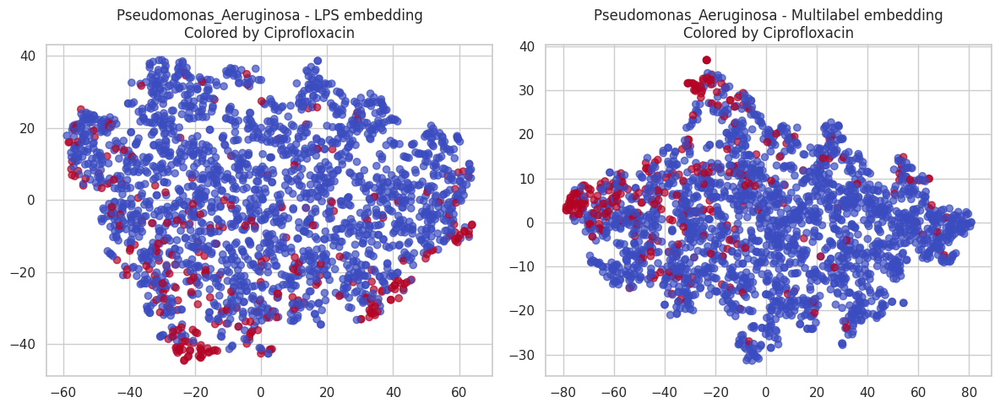

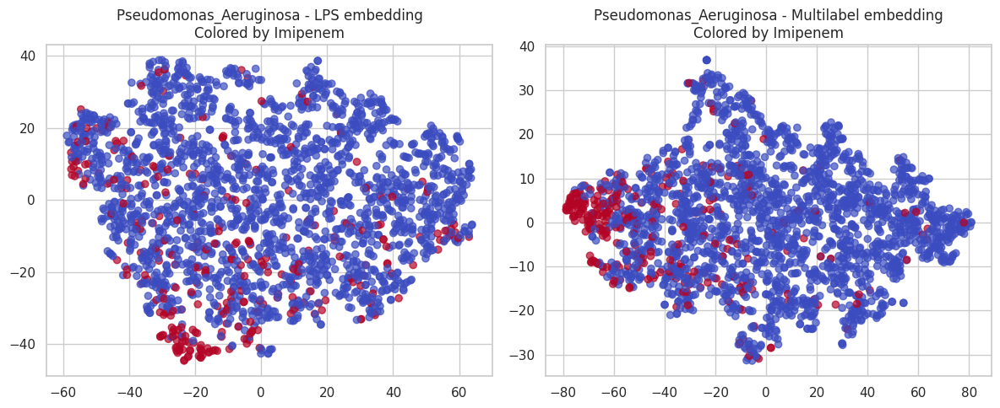

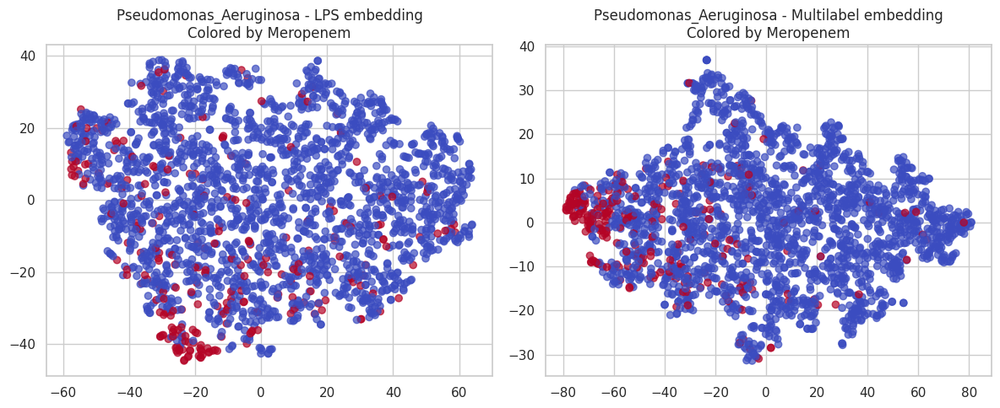


===== Klebsiella_Pneumoniae =====


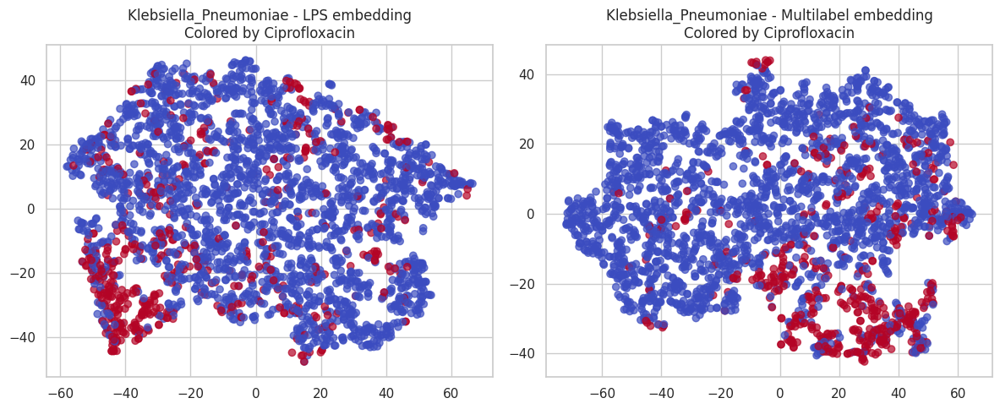

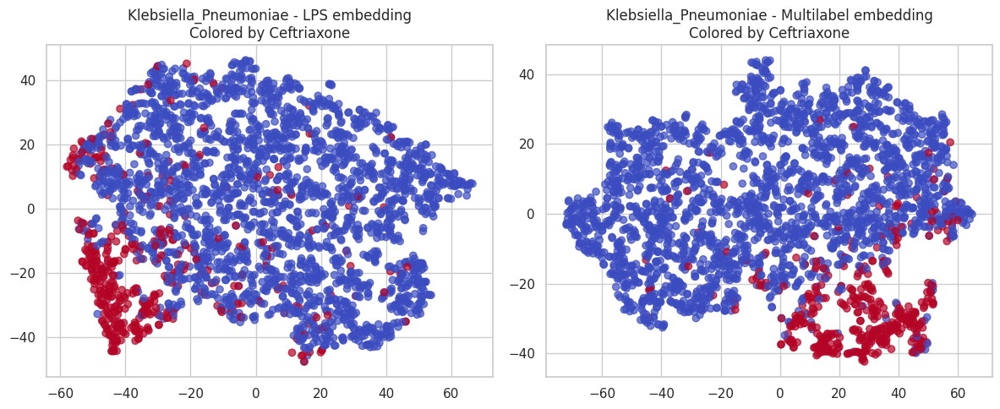

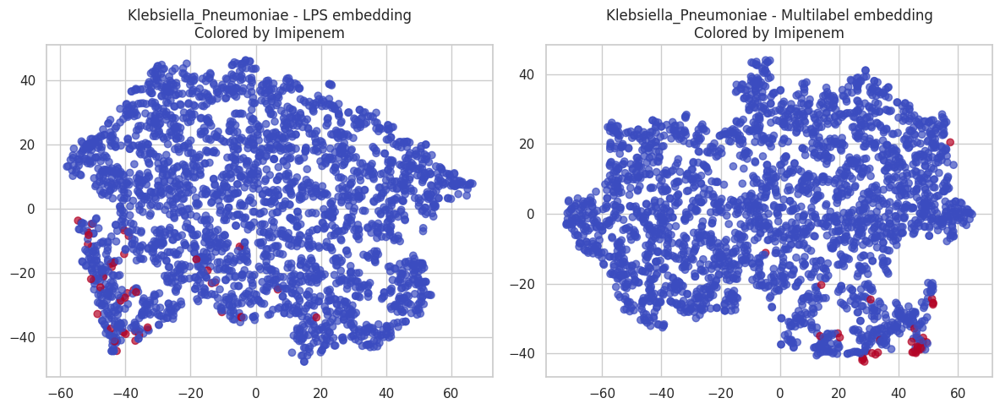

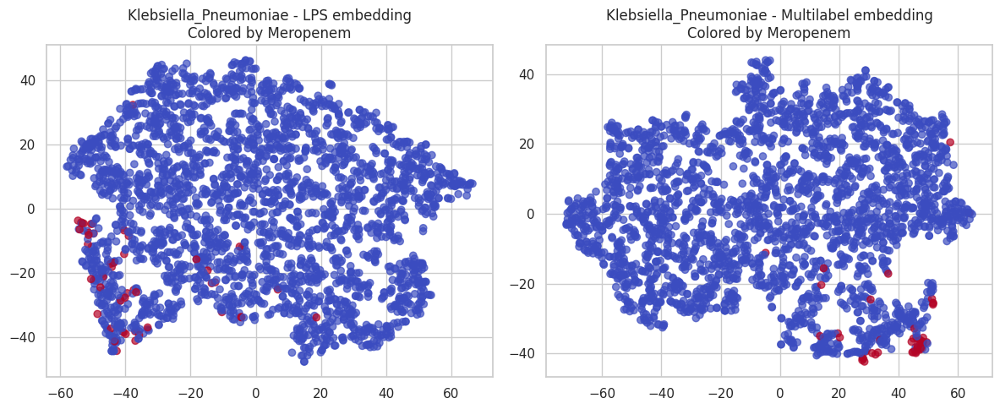


===== Escherichia_Coli =====


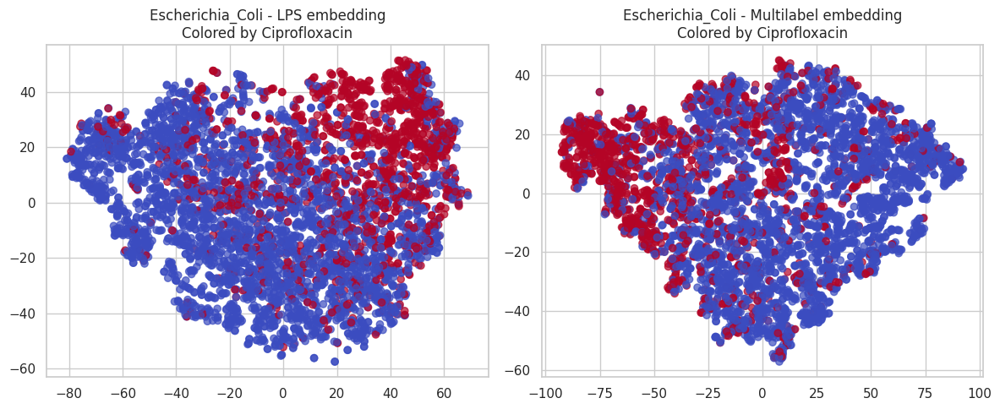

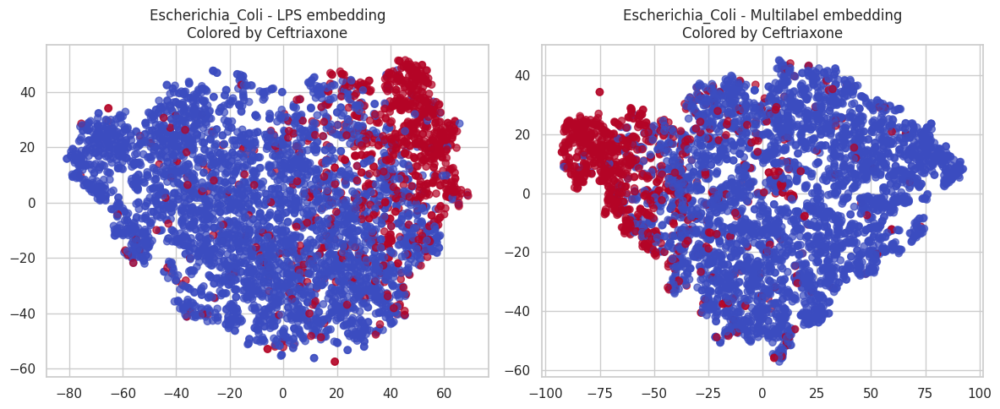

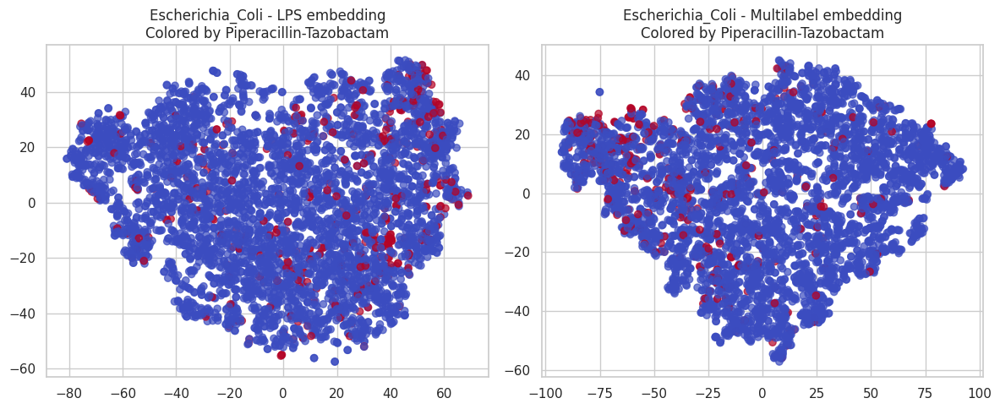

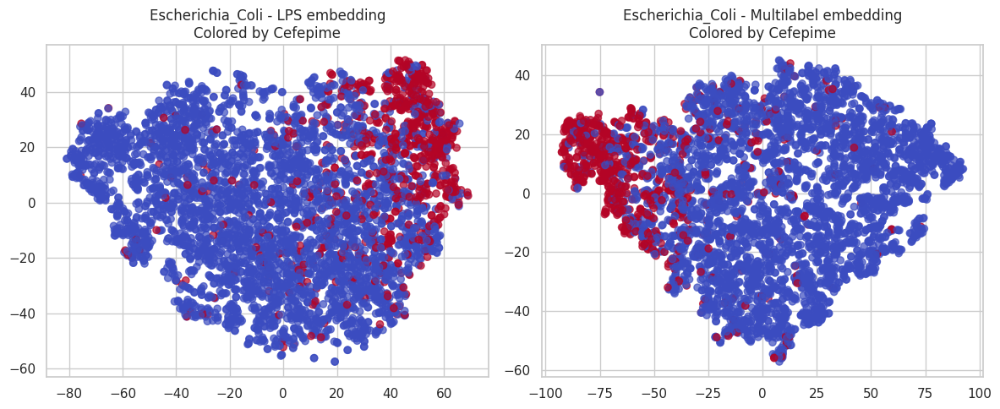


===== Staphylococcus_Aureus =====


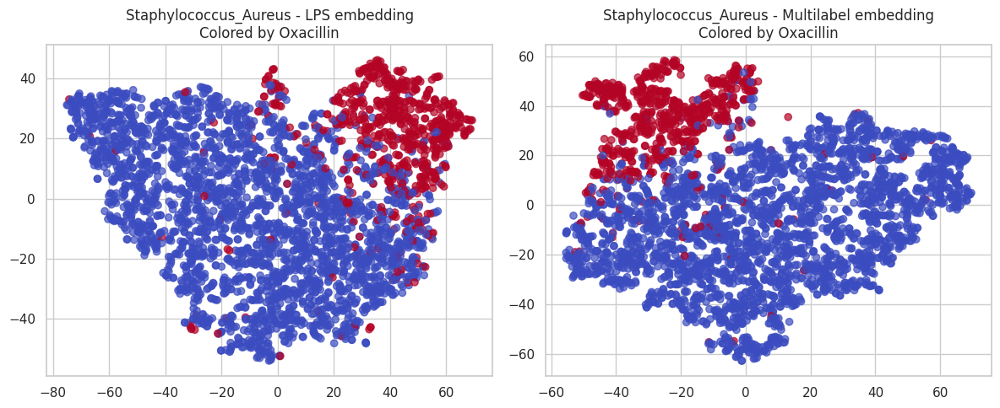

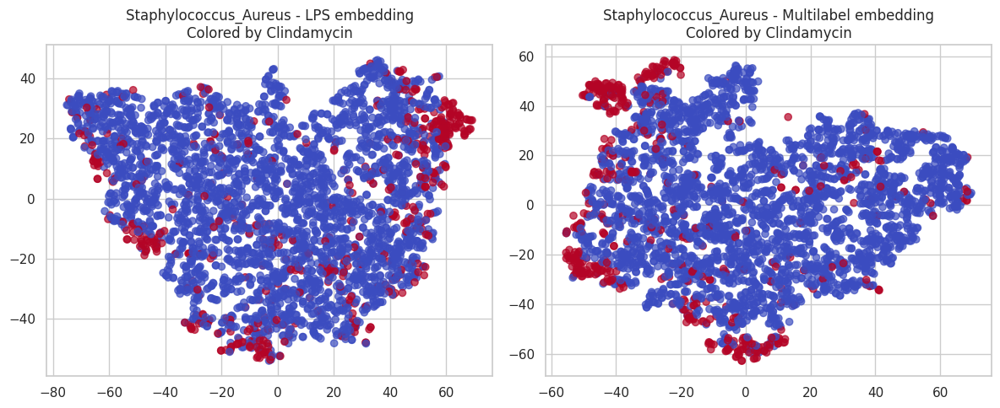

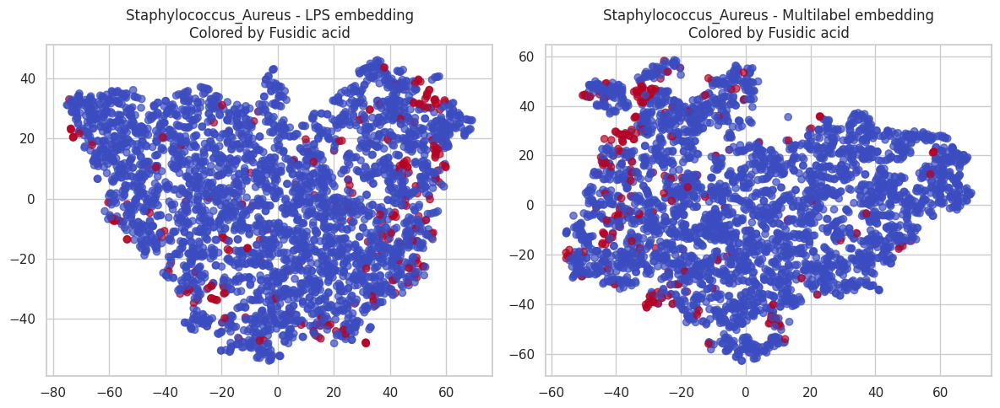

In [68]:
for sp in amr_df["species"].unique():
    plot_tsne_for_species(sp)

In [69]:
def extract_last_embedding(model, X_array):
    model.eval()
    X_tensor = torch.tensor(X_array, dtype=torch.float32).to(device)

    with torch.no_grad():
        layers = list(model.net.children())
        embedding_model = nn.Sequential(*layers[:-1]).to(device)
        emb = embedding_model(X_tensor)

    return emb.cpu().numpy()

In [72]:
def plot_tsne_patterns_with_legend(species):

    print(f"\n===== {species} =====")

    # localizar última carpeta benchmark
    sp_root = sorted([d for d in os.listdir(MODEL_ROOT) if d.startswith("benchmark")])[-1]
    sp_path = os.path.join(MODEL_ROOT, sp_root, species)

    summary = pd.read_csv(os.path.join(sp_path, f"{species}__summary.csv"))
    ab_list = summary[summary.Task=="binary"]["Antibiotic"].tolist()

    # filtrar datos
    df_sp = amr_df[amr_df["species"] == species].copy()
    df_sp = df_sp.dropna(subset=ab_list)

    idx = df_sp.index.values
    feat_ok = ~np.isnan(X[idx]).any(axis=1)
    df_sp = df_sp.loc[idx[feat_ok]]

    # generar patrones
    df_sp["pattern"] = df_sp[ab_list].astype(int).astype(str).agg("".join, axis=1)

    # mantener solo patrones con >=10 muestras
    counts = df_sp["pattern"].value_counts()
    valid_patterns = counts[counts >= 10].index
    df_sp = df_sp[df_sp["pattern"].isin(valid_patterns)].copy()

    if df_sp["pattern"].nunique() < 2:
        print("Not enough patterns.")
        return

    X_sp = X[df_sp.index]
    patterns = df_sp["pattern"].values

    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X_sp)

    # cargar modelos
    lps_row = summary[summary.Task=="lps_multiclass"].iloc[0]
    multi_row = summary[summary.Task=="direct_multilabel"].iloc[0]

    lps_model = load_model_from_saved(
        lps_row["model_path"],
        input_dim=X_scaled.shape[1],
        output_dim=int(lps_row["n_patterns"])
    )

    multi_model = load_model_from_saved(
        multi_row["model_path"],
        input_dim=X_scaled.shape[1],
        output_dim=len(ab_list)
    )

    # extraer embeddings
    emb_lps = extract_last_embedding(lps_model, X_scaled)
    emb_multi = extract_last_embedding(multi_model, X_scaled)

    # t-SNE
    tsne = TSNE(n_components=2, random_state=42, perplexity=30)
    emb_lps_2d = tsne.fit_transform(emb_lps)

    tsne2 = TSNE(n_components=2, random_state=42, perplexity=30)
    emb_multi_2d = tsne2.fit_transform(emb_multi)

    # patrones únicos
    unique_patterns = np.unique(patterns)

    # crear etiquetas literales
    def pattern_to_label(p):
        label_parts = []
        for bit, ab in zip(p, ab_list):
            status = "R" if bit == "1" else "S"
            label_parts.append(f"{ab}={status}")
        return " | ".join(label_parts)

    pattern_labels = {p: pattern_to_label(p) for p in unique_patterns}

    # paleta de colores
    palette = sns.color_palette("tab20", len(unique_patterns))
    color_dict = dict(zip(unique_patterns, palette))
    colors = [color_dict[p] for p in patterns]

    fig, axes = plt.subplots(1,2, figsize=(16,7))

    # LPS plot
    axes[0].scatter(
        emb_lps_2d[:,0],
        emb_lps_2d[:,1],
        c=colors,
        alpha=0.8
    )
    axes[0].set_title(f"{species} - LPS embedding (colored by pattern)")

    # Multilabel plot
    axes[1].scatter(
        emb_multi_2d[:,0],
        emb_multi_2d[:,1],
        c=colors,
        alpha=0.8
    )
    axes[1].set_title(f"{species} - Multilabel embedding (colored by pattern)")

    # construir leyenda manual
    handles = []
    for p in unique_patterns:
        handles.append(
            plt.Line2D(
                [0], [0],
                marker='o',
                color='w',
                label=pattern_labels[p],
                markerfacecolor=color_dict[p],
                markersize=8
            )
        )

    axes[1].legend(
        handles=handles,
        title="Resistance Patterns",
        bbox_to_anchor=(1.05, 1),
        loc="upper left"
    )

    plt.tight_layout()
    plt.show()


===== Pseudomonas_Aeruginosa =====


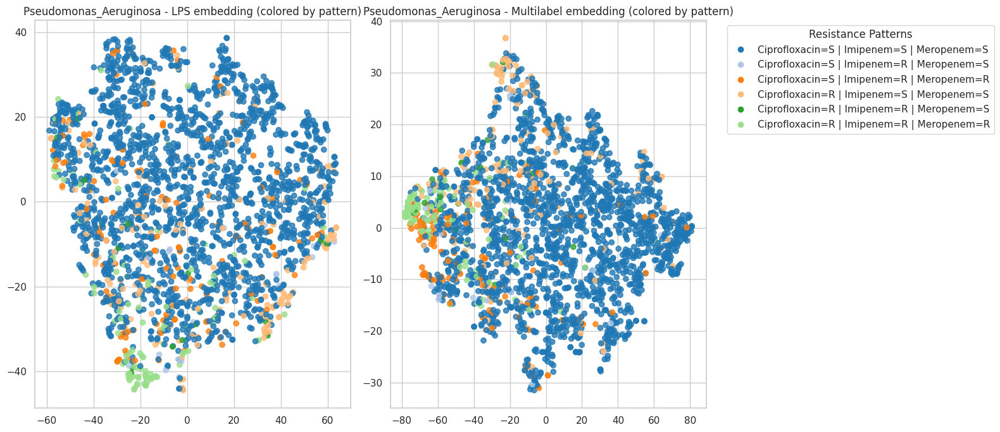


===== Klebsiella_Pneumoniae =====


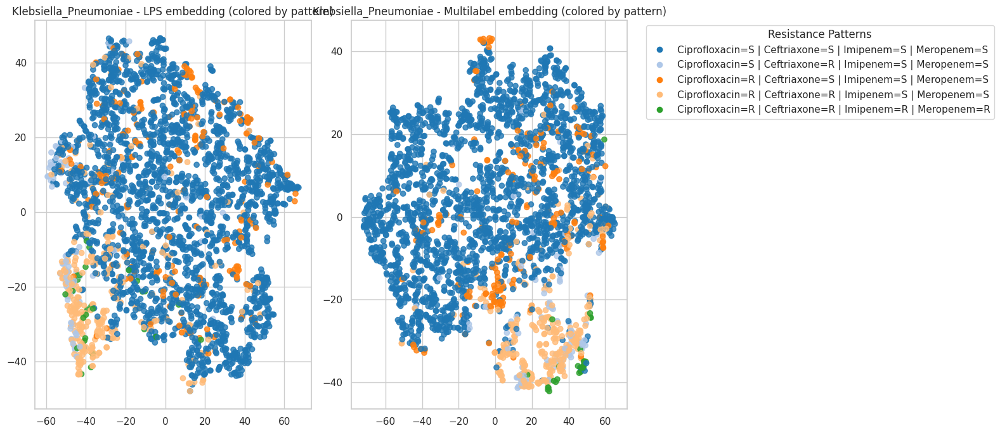


===== Escherichia_Coli =====


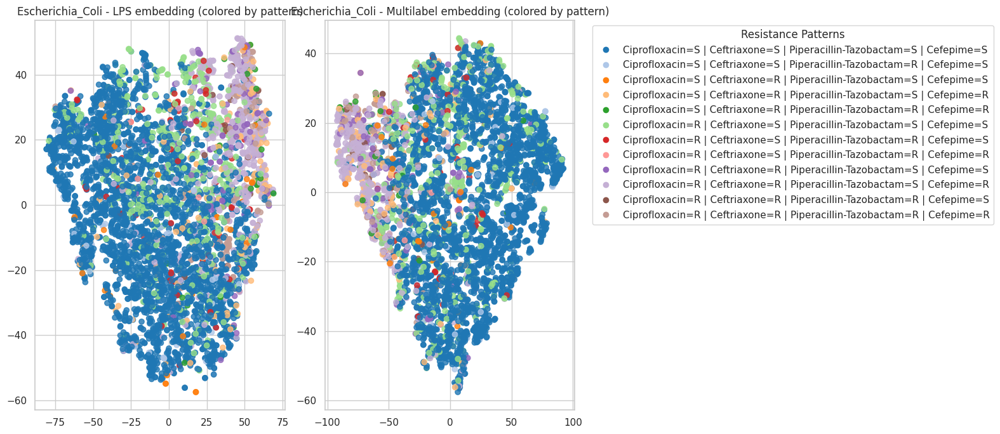


===== Staphylococcus_Aureus =====


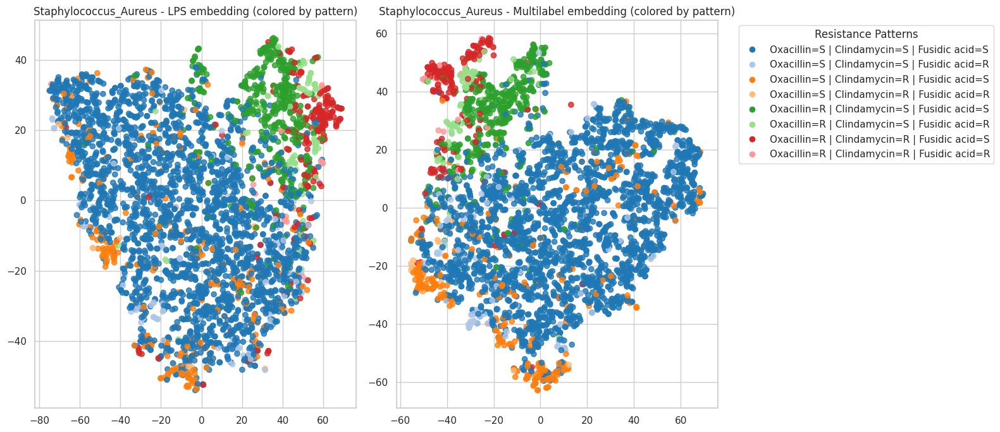

In [73]:
for sp in amr_df["species"].unique():
    plot_tsne_patterns_with_legend(sp)

## Preprocessing analysis

# Ablation study: preprocessing variants

We retrain ONLY the LPS (multiclass) model using:

- New pickle: binarization=3
- New pickle: doubled spectral region

We reuse previously cross-validated hyperparameters.

We perform:

- 80/20 stratified split by pattern
- max_epochs = 1200
- patience = 50
- Metrics computed as before (antibiotic-wise)

Goal: assess impact of preprocessing on performance.

In [77]:
PICKLE_BIN3 = "/export/usuarios01/egarroyo/MALDI_for_AMR_prediction/data/DRIAMS_A_AMR_3 bins.pkl"
PICKLE_DOUBLE_REGION = "/export/usuarios01/egarroyo/MALDI_for_AMR_prediction/data/DRIAMS_A_AMR_whole_spectra.pkl"

MODEL_ROOT = "/export/usuarios01/egarroyo/MALDI_for_AMR_prediction/saved_models"

In [78]:
def train_lps_from_pickle(pickle_path, species):

    # cargar datos
    with open(pickle_path, "rb") as f:
        payload = pickle.load(f)

    X_new = np.asarray(payload["data"])
    y_species_new = np.asarray(payload["label"])
    amr_new = np.asarray(payload["amr"])
    antibiotics = list(payload["antibiotics"])

    amr_df_new = pd.DataFrame(amr_new, columns=antibiotics)
    amr_df_new["species"] = y_species_new

    # localizar última carpeta benchmark
    sp_root = sorted([d for d in os.listdir(MODEL_ROOT) if d.startswith("benchmark")])[-1]
    sp_path = os.path.join(MODEL_ROOT, sp_root, species)

    summary = pd.read_csv(os.path.join(sp_path, f"{species}__summary.csv"))
    ab_list = summary[summary.Task=="binary"]["Antibiotic"].tolist()

    # filtrar especie
    df_sp = amr_df_new[amr_df_new["species"] == species].copy()
    df_sp = df_sp.dropna(subset=ab_list)

    idx = df_sp.index.values
    feat_ok = ~np.isnan(X_new[idx]).any(axis=1)
    df_sp = df_sp.loc[idx[feat_ok]]

    # generar patrones
    df_sp["pattern"] = df_sp[ab_list].astype(int).astype(str).agg("".join, axis=1)

    # mantener patrones >=10
    counts = df_sp["pattern"].value_counts()
    valid_patterns = counts[counts >= 10].index
    df_sp = df_sp[df_sp["pattern"].isin(valid_patterns)].copy()

    if df_sp["pattern"].nunique() < 2:
        return None

    X_sp = X_new[df_sp.index]
    patterns = df_sp["pattern"].values
    y_multi = df_sp[ab_list].astype(int).values

    # 80/20 split estratificado por patrón
    train_idx, test_idx = train_test_split(
        np.arange(len(X_sp)),
        test_size=0.2,
        stratify=patterns,
        random_state=42
    )

    scaler = StandardScaler()
    X_train = scaler.fit_transform(X_sp[train_idx])
    X_test = scaler.transform(X_sp[test_idx])

    y_train_multi = y_multi[train_idx]
    y_test_multi = y_multi[test_idx]

    # convertir patrones train a clases
    train_patterns = patterns[train_idx]
    classes = {p:i for i,p in enumerate(np.unique(train_patterns))}
    y_train_class = np.array([classes[p] for p in train_patterns])

    # cargar hiperparámetros previos
    lps_row = summary[summary.Task=="lps_multiclass"].iloc[0]
    hp = {k.replace("hp_",""):lps_row[k] for k in lps_row.index if k.startswith("hp_")}

    # construir modelo con nueva dimensión input
    model = MLP(
        input_dim=X_train.shape[1],
        output_dim=len(classes),
        layer1=int(hp["layer1"]),
        layer2=int(hp["layer2"]),
        layer3=int(hp["layer3"]),
        activation=hp["activation"]
    ).to(device)

    optimizer = torch.optim.Adam(model.parameters(), lr=float(hp["lr"]))
    criterion = nn.CrossEntropyLoss()

    model = train_model(
        model, optimizer, criterion,
        X_train, y_train_class,
        X_train, y_train_class,
        task_type="multiclass"
    )

    # predicción test
    with torch.no_grad():
        logits = model(torch.tensor(X_test, dtype=torch.float32).to(device))
        pred_class = torch.argmax(logits, 1).cpu().numpy()

    inv = {v:k for k,v in classes.items()}
    preds = np.array([[int(c) for c in inv[i]] for i in pred_class])

    metrics = evaluate_multilabel(y_test_multi, preds)

    return metrics

In [79]:
species_list = np.unique(y_species)

rows = []

for sp in species_list:

    print(f"\n===== {sp} =====")

    metrics_bin3 = train_lps_from_pickle(PICKLE_BIN3, sp)
    metrics_double = train_lps_from_pickle(PICKLE_DOUBLE_REGION, sp)

    rows.append({
        "Species": sp,

        "BIN3_ACC": None if metrics_bin3 is None else metrics_bin3["ACC"],
        "BIN3_HL": None if metrics_bin3 is None else metrics_bin3["HL"],
        "BIN3_WF1": None if metrics_bin3 is None else metrics_bin3["WF1"],

        "DOUBLE_ACC": None if metrics_double is None else metrics_double["ACC"],
        "DOUBLE_HL": None if metrics_double is None else metrics_double["HL"],
        "DOUBLE_WF1": None if metrics_double is None else metrics_double["WF1"],
    })

ablation_df = pd.DataFrame(rows)
ablation_df


===== Escherichia_Coli =====

===== Klebsiella_Pneumoniae =====

===== Pseudomonas_Aeruginosa =====

===== Staphylococcus_Aureus =====


,Species,BIN3_ACC,BIN3_HL,BIN3_WF1,DOUBLE_ACC,DOUBLE_HL,DOUBLE_WF1
0,Escherichia_Coli,0.863734,0.136266,0.857807,0.854345,0.145655,0.847699
1,Klebsiella_Pneumoniae,0.925313,0.074687,0.921890,0.921735,0.078265,0.916694
2,Pseudomonas_Aeruginosa,0.828909,0.171091,0.821608,0.856195,0.143805,0.828347
3,Staphylococcus_Aureus,0.902154,0.097846,0.898160,0.891386,0.108614,0.881960
